# UFO predictions in the US

Dit Jupyter Notebook gaat ons vertellen over feiten en visualiseren van de UFO bezichtigingen en het 
inschatten van de volgende UFO bezichtiging. Een voorbeeld van zo'n visualisatie, zal als volgt eruit zien:

##### Geslacht ratio in Amerika:

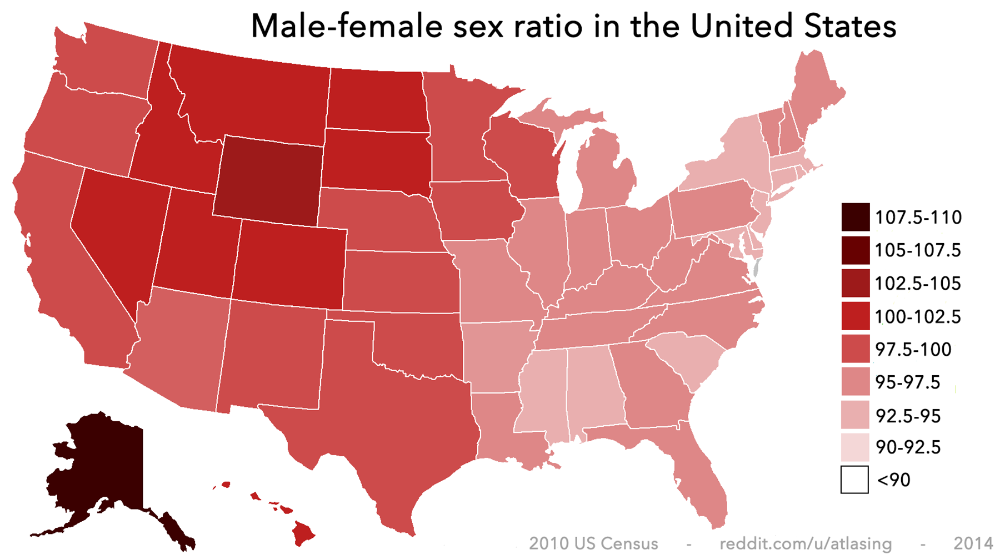

In [53]:
from IPython.display import Image
Image(filename='example_ratio.png') #bron: https://www.reddit.com/r/MapPorn/comments/21evhb/malefemale_sex_ratios_across_the_united_states/

### Table of contents: 
- Data Preparations
    * [Import Libraries](#import)
    * [Pandas Settings](#setting)
    * [UfoData Reading](#read)
- Data Usage
    * [Default Ufo Table](#def)
    * [Research Coordinates Ufo Table](#res_coord)
    * [Default Research Ufo Table](#res_def)
    * [Default Externe Dataset](#def_ext)
- Simplify Data
    * [Deleting duplicate data](#dup_delete)
- Visualisation   
    * [State Sightings](#state_sight)
    * [World Sightings](#world_sight)
    * [Dagmoment Clustering](#clustering)
    * [Interactive visualitation](#interactive)
- Prediction
    * [Former years table](#former_table)
    * [Last known sighting year prediction table](#predic_table)
- [Z_toets vraag](#z_toets)
- [Vragen](#vragen)

#### Import Libraries: <a class="anchor" id="import"></a>

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
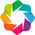

In [54]:
import pandas as pd
import numpy as np
import geopandas
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import scipy.stats as stats
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score 
import re
from datetime import time

from bokeh.models import *
from bokeh.plotting import *
from bokeh.io import *
from bokeh.tile_providers import *
from bokeh.palettes import *
from bokeh.transform import *
from bokeh.layouts import *

import holoviews as hv
from holoviews import dim
hv.extension('bokeh')

In [55]:
states = geopandas.read_file('data/usa-states-census-2014.shp')

#### Pandas Settings <a class="anchor" id="setting"></a>

In [56]:
pd.set_option('display.max_colwidth',None)
pd.set_option('max_rows', 100)

#### Ufodata reading: <a class="anchor" id="read"></a>

In [57]:
read = pd.read_csv('ufo.csv', low_memory= False)
ufodata = pd.DataFrame(read) #Guy's benaming
ufo_data = pd.DataFrame(read) #Ruben's benaming
nondrop_ufo_data = ufo_data #ufo_data met nan's er nog in (voor z_toets)
ufo_data = ufo_data.dropna()

#####  Default Ufo table: <a class="anchor" id="def"></a>

In [58]:
indexNames = ufo_data[ ufo_data['shape'] == 'unknown' ].index
ufo_data.drop(indexNames , inplace=True) #delete unknown shapes
#------------
pd.set_option('display.max_colwidth', None) #increase comment column size
# -----------
default_ufo_information = ufo_data[['shape', 'city', 'country', 'datetime', 'comments']]
default_ufo_information #get only shape, city, country, datetime and comments

d:\users\ruben\appdata\local\programs\python\python37\lib\site-packages\pandas\core\frame.py:4169: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,shape,city,country,datetime,comments
0,cylinder,san marcos,us,10/10/1949 20:30,This event took place in early fall around 1949-50. It occurred after a Boy Scout meeting in the Baptist Church. The Baptist Church sit
3,circle,edna,us,10/10/1956 21:00,My older brother and twin sister were leaving the only Edna theater at about 9 PM&#44...we had our bikes and I took a different route home
4,light,kaneohe,us,10/10/1960 20:00,AS a Marine 1st Lt. flying an FJ4B fighter/attack aircraft on a solo night exercise&#44 I was at 50&#44000&#39 in a &quot;clean&quot; aircraft (no ordinan
5,sphere,bristol,us,10/10/1961 19:00,My father is now 89 my brother 52 the girl with us now 51 myself 49 and the other fellow which worked with my father if he&#39s still livi
7,disk,norwalk,us,10/10/1965 23:45,A bright orange color changing to reddish color disk/saucer was observed hovering above power transmission lines.
...,...,...,...,...,...
88674,other,napa,us,9/9/2013 22:00,Napa UFO&#44
88675,circle,vienna,us,9/9/2013 22:20,Saw a five gold lit cicular craft moving fastly from rght to left.
88676,cigar,edmond,us,9/9/2013 23:00,2 witnesses 2 miles apart&#44 Red &amp; White Elongated-Cigar Shaped Flashing lights&#44 NW of Oklahoma City
88677,diamond,starr,us,9/9/2013 23:00,On September ninth my wife and i noticed strange lights in the sky. Two white lights and a red light. I had noticed this the night befo


#####  Research Coordinates Ufo Table <a class="anchor" id="res_coord"></a>

In [59]:
# Get research Coordinates Ufo table
indexNames = ufo_data[ ufo_data['latitude'] == 'unknown' ].index
ufo_data.drop(indexNames , inplace=True) #delete unknown latitude
#------------
pd.set_option('display.max_colwidth', None) #increase comment column size
# -----------
default_coordinates_information = ufo_data[['latitude', 'longitude']]
default_coordinates_information = default_coordinates_information.dropna()
default_coordinates_information #get only shape, city, country, datetime and comments

d:\users\ruben\appdata\local\programs\python\python37\lib\site-packages\pandas\core\frame.py:4169: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,latitude,longitude
0,29.8830556,-97.941111
3,28.9783333,-96.645833
4,21.4180556,-157.803611
5,36.5950000,-82.188889
7,41.1175000,-73.408333
...,...,...
88674,38.2972222,-122.284444
88675,38.9011111,-77.265556
88676,35.6527778,-97.477778
88677,34.3769444,-82.695833


#####  Default Research Ufo table: <a class="anchor" id="res_def"></a>

In [60]:
# Get research Ufo table
indexNames = ufo_data[ ufo_data['shape'] == 'unknown' ].index
ufo_data.drop(indexNames , inplace=True) #delete unknown shapes
#------------
pd.set_option('display.max_colwidth', None) #increase comment column size
# -----------

default_ufo_information = ufo_data[['shape', 'latitude', 'longitude', 'datetime', 'duration (seconds)', 'duration (hours/min)']]
default_ufo_information #get only shape, city, country, datetime and comments

d:\users\ruben\appdata\local\programs\python\python37\lib\site-packages\pandas\core\frame.py:4169: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,shape,latitude,longitude,datetime,duration (seconds),duration (hours/min)
0,cylinder,29.8830556,-97.941111,10/10/1949 20:30,2700,45 minutes
3,circle,28.9783333,-96.645833,10/10/1956 21:00,20,1/2 hour
4,light,21.4180556,-157.803611,10/10/1960 20:00,900,15 minutes
5,sphere,36.5950000,-82.188889,10/10/1961 19:00,300,5 minutes
7,disk,41.1175000,-73.408333,10/10/1965 23:45,1200,20 minutes
...,...,...,...,...,...,...
88674,other,38.2972222,-122.284444,9/9/2013 22:00,1200,hour
88675,circle,38.9011111,-77.265556,9/9/2013 22:20,5,5 seconds
88676,cigar,35.6527778,-97.477778,9/9/2013 23:00,1020,17 minutes
88677,diamond,34.3769444,-82.695833,9/9/2013 23:00,0,2 nights


#####  Default Externe Dataset<a class="anchor" id="def_ext"></a>

In [61]:
read = pd.read_csv('nuforc_reports.csv')
ufodata2 = pd.DataFrame(read)
ufodata2 = ufodata2[['city', 'state', 'date_time', 'shape', 'duration']]
ufodata2 = ufodata2.dropna()
#----------
# for ind in ufodata2.index: 
#      print(ufodata2['duration'][ind])  
ufodata2

,city,state,date_time,shape,duration
0,Chester,VA,2019-12-12T18:43:00,light,5 seconds
1,Rocky Hill,CT,2019-03-22T18:30:00,circle,3-5 seconds
3,Ottawa,ON,2019-04-17T02:00:00,teardrop,10 seconds
4,Peoria,NY,2009-03-15T18:00:00,cigar,2 minutes
5,Kirbyville,TX,2019-04-02T20:25:00,disk,15 minutes
...,...,...,...,...,...
88120,Tempe,AZ,2019-10-02T20:00:00,formation,3 minutes
88121,Bolivar,MO,2019-10-02T20:00:00,light,20 seconds
88122,North Port,FL,2019-10-02T20:03:00,formation,20 seconds
88123,Black Mountain,NC,2019-10-02T22:00:00,fireball,2 minutes


#####  Deleting duplicate data <a class="anchor" id="dup_delete"></a>

In [62]:
firstdataset = ufodata
firstdataset = firstdataset.dropna()
#makes the firstdataset comparable with extern dataset:
firstdataset['state'] = firstdataset['state'].str.upper() 
firstdataset['city'] = firstdataset['city'].str.title() 
firstdataset = firstdataset.rename(columns={"datetime": "date_time"})

s=pd.concat([ufodata2, firstdataset],keys=[1,2]).drop_duplicates(['date_time', 'city'],keep='first') #delete duplicates
noclonedatasetextern =s.loc[1].dropna(axis=1)
noclonedatasetextern

d:\users\ruben\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
d:\users\ruben\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,city,state,date_time,shape,duration
0,Chester,VA,2019-12-12T18:43:00,light,5 seconds
1,Rocky Hill,CT,2019-03-22T18:30:00,circle,3-5 seconds
3,Ottawa,ON,2019-04-17T02:00:00,teardrop,10 seconds
4,Peoria,NY,2009-03-15T18:00:00,cigar,2 minutes
5,Kirbyville,TX,2019-04-02T20:25:00,disk,15 minutes
...,...,...,...,...,...
88120,Tempe,AZ,2019-10-02T20:00:00,formation,3 minutes
88121,Bolivar,MO,2019-10-02T20:00:00,light,20 seconds
88122,North Port,FL,2019-10-02T20:03:00,formation,20 seconds
88123,Black Mountain,NC,2019-10-02T22:00:00,fireball,2 minutes


#####  State Sight Countings <a class="anchor" id="state_sight"></a>

   STUSPS  sightings
0      CA      17951
1      FL       8849
2      WA       7416
3      TX       6790
4      NY       6260
5      PA       5306
6      AZ       5172
7      IL       4871
8      OH       4860
9      NC       4107
10     MI       3951
11     OR       3609
12     CO       3211
13     MO       3085
14     GA       2933
15     NJ       2925
16     VA       2915
17     MA       2880
18     ON       2708
19     IN       2693
20     WI       2660
21     SC       2518
22     TN       2478
23     MN       2281
24     CT       2088
25     MD       1972
26     KY       1849
27     NV       1724
28     NM       1670
29     OK       1567
30     UT       1498
31     AL       1473
32     IA       1416
33     ID       1280
34     KS       1272
35     ME       1242
36     LA       1223
37     AR       1211
38     NH       1178
39     BC       1162
40     MT       1072
41     WV        989
42     MS        821
43     NE        792
44     AK        704
45     HI        670
46     AB    

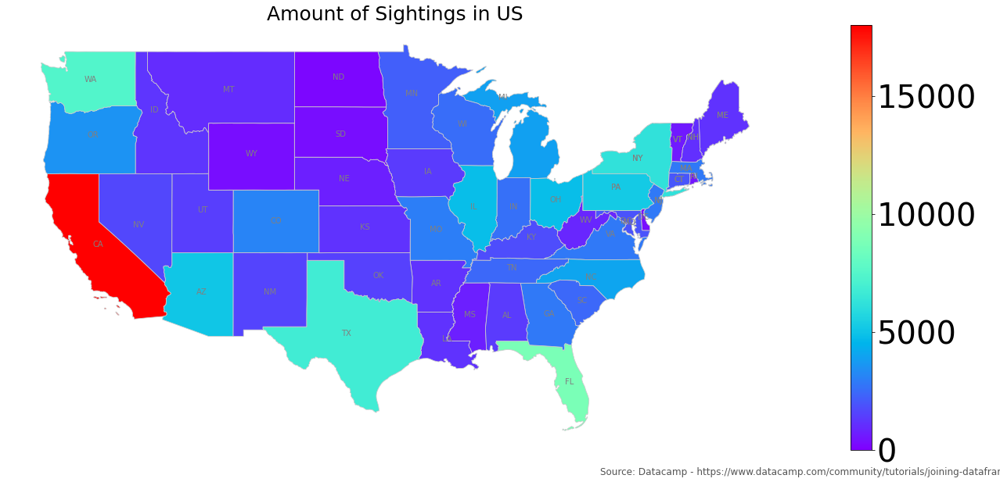

In [63]:
#makes both datasets have equal appellation and concatenate them and gives it the right appellation as well
onlystateextern = noclonedatasetextern[['state']]
onlystatefirst = firstdataset[['state']]
onlystatetotal = pd.concat([onlystateextern, onlystatefirst])
onlystatetotal.dropna()
countings = onlystatetotal['state'].value_counts()
countings = pd.DataFrame(countings)

countings = countings.reset_index() #thanks Mark
countings = countings.rename(columns={'index': 'STUSPS', 'state': 'sightings'})
countings = countings.dropna()
print(countings)
states = geopandas.read_file('data/usa-states-census-2014.shp')

#merge the onlystatedataset with the US states dataset
states = states.to_crs("EPSG:3395")
plt.rcParams['figure.figsize'] = [50, 70] #height, width of the plot
merged = states.merge(countings, how='left', left_on="STUSPS", right_on="STUSPS")

# set the value column that will be visualised
variable = 'sightings'
# set the range for the choropleth values
vmin, vmax = 0, 18000
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(30, 10))
# remove the axis
ax.axis('off')
# add a title and annotation
ax.set_title('Amount of Sightings in US', fontdict={'fontsize': '25', 'fontweight' : '3'})
ax.annotate('Source: Datacamp - https://www.datacamp.com/community/tutorials/joining-dataframes-pandas', xy=(0.6, .05), xycoords='figure fraction', fontsize=12, color='#555555')
# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=plt.Normalize(vmin=vmin, vmax=vmax))
# empty array for the data range
sm.set_array([]) # or alternatively sm._A = []. Not sure why this step is necessary, but many recommends it
# add the colorbar to the figure
fig.colorbar(sm)
# create map
merged.plot(column=variable, cmap='rainbow', linewidth=0.8, ax=ax, edgecolor='0.8')

# Add Labels
merged['coords'] = merged['geometry'].apply(lambda x: x.representative_point().coords[:])
merged['coords'] = [coords[0] for coords in merged['coords']]
for idx, row in merged.iterrows():
    plt.annotate(s=row['STUSPS'], xy=row['coords'],horizontalalignment='center', color='gray')

#source: https://towardsdatascience.com/a-beginners-guide-to-create-a-cloropleth-map-in-python-using-geopandas-and-matplotlib-9cc4175ab630


#####  World sight Counting Points<a class="anchor" id="world_sight"></a>

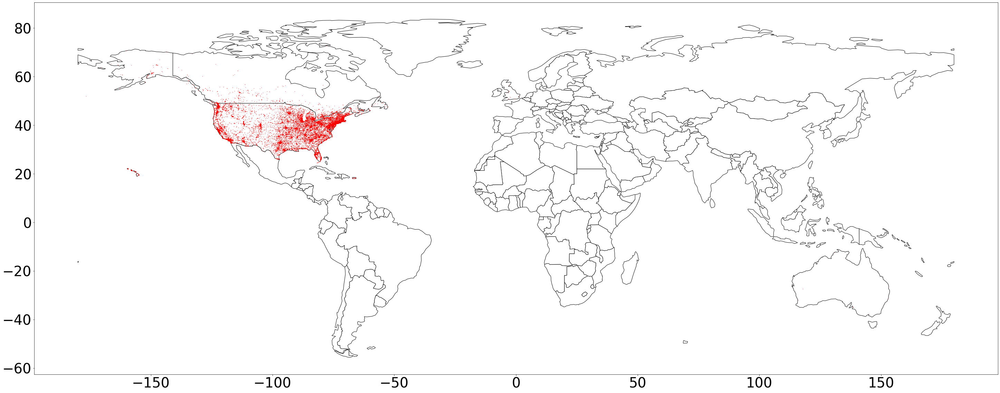

In [64]:
gdf = geopandas.GeoDataFrame(
    default_coordinates_information, geometry=geopandas.points_from_xy(default_ufo_information.longitude, default_ufo_information.latitude))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
world = world[(world.pop_est>0) & (world.name!="Antarctica")]
base = world.plot(color='white', edgecolor='black')

gdf.plot(ax=base, marker='*', color='red', markersize=0.1);

#####  Former Years on 1 Example State Sightings Table in US<a class="anchor" id="former_table"></a>

In [89]:
date_state_extern = noclonedatasetextern[['state', 'date_time']]
date_state_extern['date_time'] = date_state_extern['date_time'].str[0:4] #only get year 

date_state_first = firstdataset[['state', 'date_time']]
date_state_first['date_time'] = date_state_first['date_time'].str[-10:-6] #only get year

date_state_total = pd.concat([date_state_first, date_state_extern]) #combine them
date_state_total = date_state_total.groupby('state') #group them on state

x = pd.DataFrame(date_state_total.get_group('NY')) #example

total_occurences = pd.DataFrame(x['date_time'].value_counts()) 
total_occurences = total_occurences.reset_index() #thanks Mark
total_occurences = total_occurences.sort_values(by='index', ascending=True)

#making of a viable dataframe
def viable_dataframe_maker (total_occurences):
    predict_dataframe = total_occurences.iloc[5:-1]
    predict_dataframe = predict_dataframe.rename(columns={"index": "year", "date_time": "target"})
    predict_dataframe.insert(1, "T_1", total_occurences['date_time'].shift(periods=1, axis='index'))
    predict_dataframe.insert(1, "T_2", total_occurences['date_time'].shift(periods=2, axis='index'))
    predict_dataframe.insert(1, "T_3", total_occurences['date_time'].shift(periods=3, axis='index'))
    predict_dataframe.insert(1, "T_4", total_occurences['date_time'].shift(periods=4, axis='index'))
    predict_dataframe.insert(1, "T_5", total_occurences['date_time'].shift(periods=5, axis='index'))
    return predict_dataframe

predict_dataframe = viable_dataframe_maker (total_occurences)
predict_dataframe

d:\users\ruben\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
d:\users\ruben\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,year,T_5,T_4,T_3,T_2,T_1,target
60,1952,1.0,3.0,1.0,1.0,1.0,3
58,1954,3.0,1.0,1.0,1.0,3.0,4
66,1955,1.0,1.0,1.0,3.0,4.0,2
65,1956,1.0,1.0,3.0,4.0,2.0,2
53,1957,1.0,3.0,4.0,2.0,2.0,6
62,1958,3.0,4.0,2.0,2.0,6.0,3
63,1959,4.0,2.0,2.0,6.0,3.0,3
57,1960,2.0,2.0,6.0,3.0,3.0,4
69,1961,2.0,6.0,3.0,3.0,4.0,1
56,1962,6.0,3.0,3.0,4.0,1.0,5


#####  Last known sightings Year prediction table<a class="anchor" id="predic_table"></a>

In [66]:
all_state_predictions = pd.DataFrame() #empty dataframe
temp_states_list = []#empty temporary dataframe
temp_pred_list = []#empty temporary dataframe
temp_act_list = []#empty temporary dataframe
temp_year_list = []#empty temporary dataframe

for name, group in date_state_total: 
    state_sightings = date_state_total.get_group(name)
    x = pd.DataFrame(date_state_total.get_group(name)) #example
    total_occurences = pd.DataFrame(x['date_time'].value_counts())
    total_occurences = total_occurences.reset_index() #thanks Mark
    total_occurences = total_occurences.sort_values(by='index', ascending=True)
    
    predict_dataframe = viable_dataframe_maker (total_occurences) #early used function
    try: #in case of unknown character value
        predict_dataframe['year'] = predict_dataframe.year.astype('int32')
        X_train = predict_dataframe.loc[predict_dataframe.year < predict_dataframe['year'].iloc[-1] ,['year', 'T_5', 'T_4', 'T_3', 'T_2', 'T_1'] ]
        y_train = predict_dataframe.loc[predict_dataframe.year < predict_dataframe['year'].iloc[-1] , ['target']]
        X_test = predict_dataframe.loc[predict_dataframe.year == predict_dataframe['year'].iloc[-1] , ['year', 'T_5', 'T_4', 'T_3', 'T_2', 'T_1'] ]
        y_test = predict_dataframe.loc[predict_dataframe.year == predict_dataframe['year'].iloc[-1] , ['target']]
        regressor = LinearRegression()
        regressor.fit(X_train, y_train)
        y_pred = regressor.predict(X_test)
        df = pd.DataFrame({'State':name ,'tested': X_test['year'], 'Actual': y_test['target'], 'Predicted': y_pred[0][0]})
        temp_states_list.append(name)
        temp_pred_list.append(y_pred[0][0])
        temp_act_list.append(y_test['target'].values[0])
        temp_year_list.append(X_test['year'].values[0])
    except ValueError:
        continue
        
all_state_predictions['State']  = temp_states_list  
all_state_predictions['Predicted']  = temp_pred_list 
all_state_predictions['Actual']  = temp_act_list
all_state_predictions['On year']  = temp_year_list 

sqrt = np.sqrt(mean_squared_error(all_state_predictions['Predicted'], all_state_predictions['Actual']))
print('Gemiddelde error verschil is', sqrt) 

r2 = r2_score(all_state_predictions['Predicted'], all_state_predictions['Actual']) 
print('R^2 score  is', r2) 

all_state_predictions

Gemiddelde error verschil is 120.99808085725304
R^2 score  is 0.1971793692617979


,State,Predicted,Actual,On year
0,AB,41.518885,16,2018
1,AK,-10.358617,20,2018
2,AL,185.150041,26,2018
3,AR,70.762022,32,2018
4,AZ,258.749637,76,2018
5,BC,40.499064,8,2018
6,CA,531.846728,270,2018
7,CO,271.220707,94,2018
8,CT,153.814613,74,2018
9,DC,17.902658,2,2018


#####  Z-toets<a class="anchor" id="z_toets"></a>

In [94]:
international_visit = nondrop_ufo_data[['country', 'visit (seconds)']]
international_visit = international_visit.dropna()

international_visit_no_DE = international_visit[international_visit.country != 'de']
international_visit_no_DE

international_visit_only_DE = international_visit[international_visit.country == 'de']
international_visit_only_DE

DE_mean = international_visit_only_DE.mean()
INT_mean = international_visit_no_DE.mean()
print("Wereld gemiddelde: " + str(INT_mean))
print("Duitsland gemiddelde: " + str(DE_mean))

DE_STD = international_visit_only_DE.std()
print("Duitsland std: " + str(DE_STD))

Wereld gemiddelde: visit (seconds)    252.591323
dtype: float64
Duitsland gemiddelde: visit (seconds)    247.535714
dtype: float64
Duitsland std: visit (seconds)    45.912358
dtype: float64


In [68]:
z_score = (DE_mean - INT_mean) / DE_STD
p_values = stats.norm.sf(abs(z_score))
betrouwbaarheid = "{:.0%}".format(p_values[0]) 
betrouwbaarheid

'46%'

In [69]:
print('Conclusie: de betrouwbaarheid van de Duitsers is {}, wat geeft dat het niet toevallig gelijke ondervragende Duitsers zijn. Dus Duitsers kijken inderdaad minder op de UFO-website dan de rest van de wereld.'.format(betrouwbaarheid))

Conclusie: de betrouwbaarheid van de Duitsers is 46%, wat geeft dat het niet toevallig gelijke ondervragende Duitsers zijn. Dus Duitsers kijken inderdaad minder op de UFO-website dan de rest van de wereld.


#####  Dagmoment Clustering<a class="anchor" id="clustering"></a>

In [70]:
ufodata2
ufodata2.dropna()

,city,state,date_time,shape,duration
0,Chester,VA,2019-12-12T18:43:00,light,5 seconds
1,Rocky Hill,CT,2019-03-22T18:30:00,circle,3-5 seconds
3,Ottawa,ON,2019-04-17T02:00:00,teardrop,10 seconds
4,Peoria,NY,2009-03-15T18:00:00,cigar,2 minutes
5,Kirbyville,TX,2019-04-02T20:25:00,disk,15 minutes
...,...,...,...,...,...
88120,Tempe,AZ,2019-10-02T20:00:00,formation,3 minutes
88121,Bolivar,MO,2019-10-02T20:00:00,light,20 seconds
88122,North Port,FL,2019-10-02T20:03:00,formation,20 seconds
88123,Black Mountain,NC,2019-10-02T22:00:00,fireball,2 minutes


In [71]:
ufodata2['date_time'] = pd.to_datetime(ufodata2['date_time'])

In [72]:
ufodata2 = ufodata2.reset_index(drop=True)
ufo3 = ufodata2.copy()

In [73]:
for count, i in enumerate(ufodata2['duration']):
    match = re.search("min|sec|hour|Sec|Min|Hour|SEC|MIN|HOUR", i)
    if match == None:
        ufodata2 = ufodata2.drop([count])
        
ufodata2 = ufodata2.reset_index(drop=True)
ufodata2

,city,state,date_time,shape,duration
0,Chester,VA,2019-12-12 18:43:00,light,5 seconds
1,Rocky Hill,CT,2019-03-22 18:30:00,circle,3-5 seconds
2,Ottawa,ON,2019-04-17 02:00:00,teardrop,10 seconds
3,Peoria,NY,2009-03-15 18:00:00,cigar,2 minutes
4,Kirbyville,TX,2019-04-02 20:25:00,disk,15 minutes
...,...,...,...,...,...
72271,Tempe,AZ,2019-10-02 20:00:00,formation,3 minutes
72272,Bolivar,MO,2019-10-02 20:00:00,light,20 seconds
72273,North Port,FL,2019-10-02 20:03:00,formation,20 seconds
72274,Black Mountain,NC,2019-10-02 22:00:00,fireball,2 minutes


In [74]:
for index ,i in enumerate(ufodata2['duration']):
    match = re.search("sec|Sec|SEC",i)
    stripe = re.search("-",i)
    digits = re.findall("\d",i)
    if stripe:
        continue
#   All values that say seconds or a few second are converted to "3 s"
    elif match and not digits:
        ufodata2.at[index, 'duration'] = "3 s"

In [75]:
for index ,i in enumerate(ufodata2['duration']):
    match = re.search("min|Min|MIN",i)
    stripe = re.search("-",i)
    digits = re.findall("\d",i)
    if stripe:
        continue
#   All values that say few seconds or seconds and other that say for example "five min" are taken an average of 3 hours 
    elif match and not digits:
        ufodata2.at[index, 'duration'] = "4 m"

In [76]:
for index ,i in enumerate(ufodata2['duration']):
    match1 = re.search(r"hour\b|Hour\b|HOUR\b",i)
    match2 = re.search("hours|Hours|HOURS",i)
    stripe = re.search("-",i)
    digits = re.findall("\d",i)
    if stripe:
        continue
#   All values that specify an hour or half an hour are taken an average of 45 min
    elif match1 and not digits:
        ufodata2.at[index, 'duration'] = "45 m"
#   All values that say hours or several hours are taken an average of 3 hours
    elif match2 and not digits:
        ufodata2.at[index, 'duration'] = "3 h"

In [77]:

def timeTransform(regexSearch, timeType, specialSearch):
    """
    Converts the simple data values such as '5 seconds'
    """
    for index, i in enumerate(ufodata2['duration']):
        match = re.search(regexSearch, i)
        special = re.search(specialSearch ,i)
        digits = re.findall("\d",i)
        if special:
            continue
        elif match and digits:
            if len(digits) > 3:
                continue
            else:
                digts = "".join(digits)
                ufodata2.at[index, 'duration'] = f"{digts} {timeType}"
timeTransform("sec|Sec|SEC", 's',':|-|[.]|~|/|to')
timeTransform("min|Min|MIN", 'm', ':|-|[.]|~|/|to')
timeTransform("hour|Hour|HOUR", 'h', ':|-|[.]|~|/|to')

def stripeTimeTransform(regexSearch, timeType, specialSearch, stripeSearch):
    """
    Converts values with 2 times and a seperator (stripe)
    """
    for index, i in enumerate(ufodata2['duration']):
        match = re.search(regexSearch, i)
        special = re.search(specialSearch ,i)
        stripe = re.search(stripeSearch,i)
        digits = re.findall("\d",i)
#        if there are min/sec/hour in it and digits and stripes but not specials, then do |
        if match and digits and stripe and not special:
            if len(digits) == 1:
                ufodata2.at[index, 'duration'] = f"{digits[0]} {timeType}"
            elif len(digits) == 2:
                z = round((int(digits[0]) + int(digits[1])) / 2)
                ufodata2.at[index, 'duration'] = f"{z} {timeType}"
            elif len(digits) == 3:
                x = round( (int(digits[0]) +  int("".join(digits[1:])) )/ 2)
                ufodata2.at[index, 'duration'] = f"{x} {timeType}"
            elif len(digits) == 4:
                y = round( (int("".join(digits[:2])) +  int("".join(digits[2:])) )/ 2)
                ufodata2.at[index, 'duration'] = f"{y} {timeType}"
            elif len(digits) == 5:
                a = round( (int("".join(digits[:2])) +  int("".join(digits[2:])) )/ 2)
                ufodata2.at[index, 'duration'] = f"{a} {timeType}"
            elif len(digits) == 6:
                b = round( (int("".join(digits[:3])) +  int("".join(digits[3:])) )/ 2)
                ufodata2.at[index, 'duration'] = f"{b} {timeType}"
            




In [78]:
stripeTimeTransform("sec|Sec|SEC", 's', 'to|:','-')
stripeTimeTransform("min|Min|MIN", 'm','to|:','-')
stripeTimeTransform("hour|Hour|HOUR", 'h','to|:','-')

# strings with 'to' convert
stripeTimeTransform("sec|Sec|SEC", 's', ':', 'to')
stripeTimeTransform("min|Min|MIN", 'm',':', 'to')
stripeTimeTransform("hour|Hour|HOUR", 'h',':', 'to')

# strings with / convert
stripeTimeTransform("sec|Sec|SEC", 's', ':', '/')
stripeTimeTransform("min|Min|MIN", 'm',':', '/')
stripeTimeTransform("hour|Hour|HOUR", 'h',':', '/')

In [79]:
def dotTimeTransform(regexSearch, timeType, specialSearch):
    """
    Converts values that ends with .
    """
    for index, i in enumerate(ufodata2['duration']):
        match = re.search(regexSearch, i)
        special = re.search(specialSearch ,i)
        dot = re.search("[.]\Z",i)
        digits = re.findall("\d",i)

        if match and dot and not special:
            x = "".join(digits)
            ufodata2.at[index, 'duration'] = f"{x} {timeType}"
dotTimeTransform("sec|Sec|SEC", 's', ":|to")
dotTimeTransform("min|Min|MIN", 'm', ":|to")
dotTimeTransform("hour|Hour|HOUR|hrs|Hrs|HRS", 'h',":|to")

def floatTimeTransform(regexSearch, timeType, specialSearch):
    """
    Converts float type values
    """
    for index, i in enumerate(ufodata2['duration']):
        match = re.search(regexSearch, i)
        special = re.search(specialSearch ,i)
        digits = re.findall("[\d.]",i)
        try:
            if match and not special:
                if len(digits) > 3:
                    digits = digits[:3]
                x = round(float("".join(digits)))
                ufodata2.at[index, 'duration'] = f"{x} {timeType}"
        except:
            continue

floatTimeTransform("hours|hour|Hours|Hour|HOURS|hrs|Hrs|HRS", 'h' , ':|-|to|/')
floatTimeTransform("min|Min|MIN", 'm', ':|-|to|/')
floatTimeTransform("sec|Sec|SEC", 's', ':|-|to|/')

# strings with 'to' convert
stripeTimeTransform("sec|Sec|SEC", 's', ':', 'to')
stripeTimeTransform("min|Min|MIN", 'm',':', 'to')
stripeTimeTransform("hour|Hour|HOUR", 'h',':', 'to')

# strings with / convert
stripeTimeTransform("sec|Sec|SEC", 's', ':', '/')
stripeTimeTransform("min|Min|MIN", 'm',':', '/')
stripeTimeTransform("hour|Hour|HOUR", 'h',':', '/')

def doubleDotTransform (regexSearch, timeType):
    "Converts values containing :"
#   only get the numbers
    for index, i in enumerate(ufodata2['duration']):
        match = re.search(":",i)
        matchTime = re.search(f"{regexSearch}",i)
        digits = re.findall(".:|..:",i)

        try:
            onlydig = list(map(lambda sub:int(''.join([ele for ele in sub if ele.isnumeric()])), digits))
            if match and matchTime and (len(onlydig) > 0):
                ufodata2.at[index, 'duration'] = f"{onlydig[0]} {timeType}"
        except:
            continue
        
        
doubleDotTransform ("sec|Sec|SEC", 's')
doubleDotTransform ("min|Min|MIN", 'm')
doubleDotTransform ("hour|Hour|HOUR", 'h')

In [91]:
coords = []
y = []
x = []
for index, i in enumerate(ufodata2['duration']):
    matchS = re.search("s",i)
    matchM = re.search("m",i)
    matchH = re.search("h",i)
    digits = re.findall("\d",i)
    try:
        if matchS:
            xs = (ufodata2.loc[index, 'date_time'].hour*60) + (ufodata2.loc[index, 'date_time'].minute)
            ys = int("".join(digits))/60
            y.append(ys)
            x.append(xs)
            coords.append((xs, ys))
        elif matchM:
            xs = (ufodata2.loc[index, 'date_time'].hour*60) + (ufodata2.loc[index, 'date_time'].minute)
            ys = int("".join(digits))
            y.append(ys)
            x.append(xs)
            coords.append((xs, ys))
        elif matchH:
            xs = (ufodata2.loc[index, 'date_time'].hour*60) + (ufodata2.loc[index, 'date_time'].minute)
            ys = int("".join(digits))*60
            y.append(ys)
            x.append(xs)
            coords.append((xs, ys))
    except:
        continue
coords

[(1123, 0.08333333333333333),
 (1110, 0.06666666666666667),
 (120, 0.16666666666666666),
 (1080, 2),
 (1225, 15),
 (660, 5),
 (1020, 10),
 (1320, 6),
 (1260, 60),
 (1320, 45),
 (1320, 4),
 (60, 2),
 (150, 60),
 (0, 5),
 (0, 20),
 (60, 0.5),
 (1222, 20),
 (1230, 0.6666666666666666),
 (1245, 5),
 (840, 0.5),
 (1133, 0.05),
 (1350, 3),
 (493, 3),
 (60, 0.55),
 (1320, 1),
 (540, 180),
 (1380, 3.5),
 (1260, 5),
 (1380, 38),
 (1305, 15),
 (1140, 5),
 (1200, 0.08333333333333333),
 (1020, 2),
 (1245, 3),
 (660, 0.05),
 (1420, 2),
 (1320, 3),
 (480, 0.03333333333333333),
 (1080, 4),
 (1350, 15),
 (1320, 60),
 (900, 45),
 (960, 5),
 (1320, 4),
 (60, 1),
 (780, 1),
 (1260, 5),
 (460, 17),
 (780, 2),
 (1275, 15),
 (1400, 12),
 (1200, 6),
 (960, 1),
 (1425, 1.0),
 (90, 0.06666666666666667),
 (1140, 12),
 (1200, 10),
 (930, 10),
 (1275, 18),
 (60, 0.75),
 (1260, 5),
 (1020, 2),
 (60, 180),
 (1430, 0.5),
 (840, 300),
 (1200, 20),
 (1080, 1.5),
 (1230, 5),
 (0, 3),
 (0, 1),
 (600, 30),
 (1230, 12),
 (

In [81]:
x.pop(19641)
y.pop(19641)

85016.91666666667

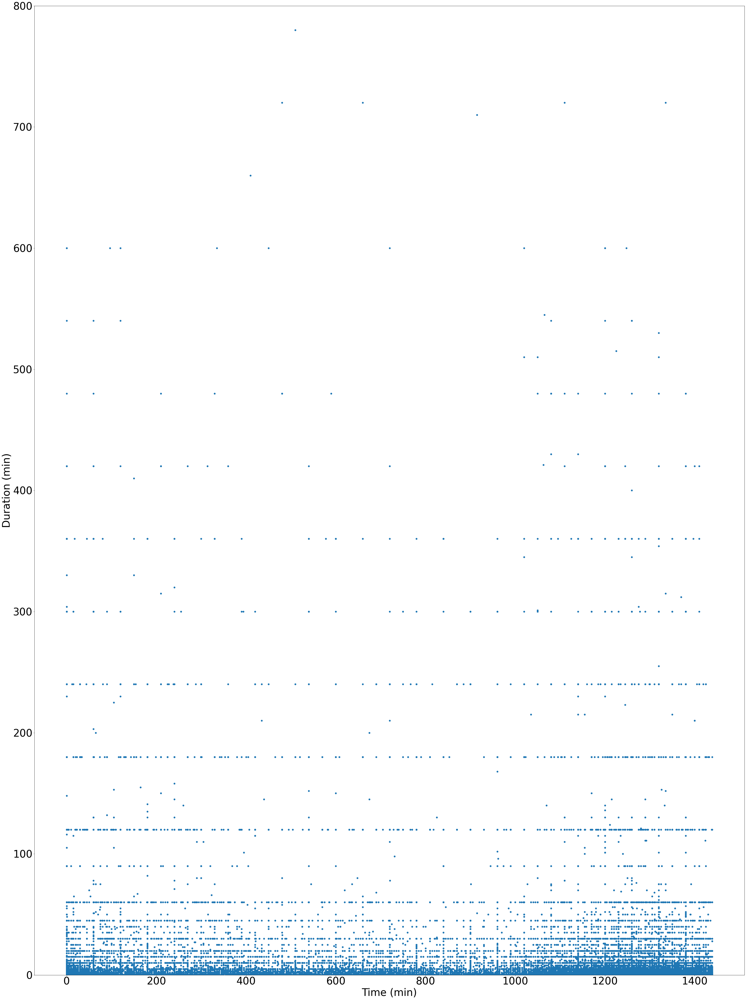

In [93]:
plt.rc('xtick', labelsize=40) 
plt.rc('ytick', labelsize=40)
plt.ylim(0,800)
plt.xlabel('Time (min)', fontsize = 40)
plt.ylabel('Duration (min)', fontsize = 40)
plt.scatter(x,y)

In [83]:
scatter = hv.Scatter(coords)

scatter.opts(color='red', marker='o', size=1, width=750, height=600,title="Ufo duration timestamp",
             xlabel='Time (min)', ylabel='Duration (min)' )


:Scatter   [x]   (y)

#####  Interactive visualitation<a class="anchor" id="interactive"></a>

In [90]:
# Dataset preparatie
ufoCoordinates = ufo_data[['datetime', 'shape', 'duration (seconds)', 'latitude', 'longitude']]
ufoCoordinates = ufoCoordinates.rename(columns={"duration (seconds)": "durationSec"})
ufoCoordinates = ufoCoordinates.convert_dtypes()
# Convert niet alles naar goede formaat, dus handmatig aanpassen
ufoCoordinates['datetime'] = pd.to_datetime(ufoCoordinates['datetime'], errors='ignore')
ufoCoordinates['latitude'] = ufoCoordinates['latitude'].astype(float)
ufoCoordinates['durationSec'] = ufoCoordinates['durationSec'].astype(float)
# Sorteren op datetime want moet van oud -> nieuw
ufoCoordinates.sort_values(by=['datetime'])
ufoCoordinates = ufoCoordinates.reset_index(drop=True)
ufoCoordinates.info()

,datetime,shape,durationSec,latitude,longitude
0,10/10/1949 20:30,cylinder,2700.0,29.883056,-97.941111
1,10/10/1956 21:00,circle,20.0,28.978333,-96.645833
2,10/10/1960 20:00,light,900.0,21.418056,-157.803611
3,10/10/1961 19:00,sphere,300.0,36.595000,-82.188889
4,10/10/1965 23:45,disk,1200.0,41.117500,-73.408333


In [95]:
# Voegt mercator coordinaten toe, aangezien pandas die gebruikt i.p.v. latitude/longitude
def x_coord(x, y):
    
    lat = x
    lon = y
    
    r_major = 6378137.000
    x = r_major * np.radians(lon)
    scale = x/lon
    y = 180.0/np.pi * np.log(np.tan(np.pi/4.0 + 
        lat * (np.pi/180.0)/2.0)) * scale
    return (x, y)
# Functie source: https://github.com/nadinezab

# defineert coordinates als tuple lat/long
ufoCoordinates['coordinates'] = list(zip(ufoCoordinates['latitude'], ufoCoordinates['longitude']))
# Maakt mercator lijst aan
mercators = [x_coord(x, y) for x, y in ufoCoordinates['coordinates']]

# Maakt mercator aan in ufoCoordinates
ufoCoordinates['mercator'] = mercators
# Splitst mercator op in X en Y, zodat het gelezen kan worden
ufoCoordinates[['mercator_x', 'mercator_y']] = ufoCoordinates['mercator'].apply(pd.Series)
ufoCoordinates

,datetime,shape,durationSec,latitude,longitude,coordinates,mercator,mercator_x,mercator_y
0,10/10/1949 20:30,cylinder,2700.0,29.883056,-97.941111,"(29.8830556, -97.9411111)","(-10902754.615379434, 3488526.570896504)",-1.090275e+07,3.488527e+06
1,10/10/1956 21:00,circle,20.0,28.978333,-96.645833,"(28.9783333, -96.6458333)","(-10758564.950247603, 3372888.6384228845)",-1.075856e+07,3.372889e+06
2,10/10/1960 20:00,light,900.0,21.418056,-157.803611,"(21.4180556, -157.8036111)","(-17566617.632991772, 2441797.635071216)",-1.756662e+07,2.441798e+06
3,10/10/1961 19:00,sphere,300.0,36.595000,-82.188889,"(36.595, -82.18888890000002)","(-9149225.261212938, 4382804.358304362)",-9.149225e+06,4.382804e+06
4,10/10/1965 23:45,disk,1200.0,41.117500,-73.408333,"(41.1175, -73.4083333)","(-8171778.282938907, 5029688.365770014)",-8.171778e+06,5.029688e+06
...,...,...,...,...,...,...,...,...,...
64376,9/9/2013 22:00,other,1200.0,38.297222,-122.284444,"(38.2972222, -122.2844444)","(-13612642.082546374, 4621498.847349161)",-1.361264e+07,4.621499e+06
64377,9/9/2013 22:20,circle,5.0,38.901111,-77.265556,"(38.9011111, -77.2655556)","(-8601162.305251367, 4707516.468671221)",-8.601162e+06,4.707516e+06
64378,9/9/2013 23:00,cigar,1020.0,35.652778,-97.477778,"(35.6527778, -97.4777778)","(-10851176.588355867, 4252948.715145907)",-1.085118e+07,4.252949e+06
64379,9/9/2013 23:00,diamond,0.0,34.376944,-82.695833,"(34.3769444, -82.6958333)","(-9205658.053681435, 4079529.4516910566)",-9.205658e+06,4.079529e+06


In [ ]:
# DEZE TABEL MOET MEERDERE MALEN RUNNEN VOOR ACCURATE INFO - TOT DE DATAFRAME NIET KLEINER WORDT MET EEN NIEUWE RUN
ufoCoordinates = ufoCoordinates.reset_index(drop=True)
i = 0 #aangemaakt om te kijken hoeveel rows over blijven
for x in range(1, (ufoCoordinates.size)+1):
    try: #Als geen try, dan crasht hij op datetime-format waarbij uur = 24:00
        t1 = datetime.strptime(ufoCoordinates['datetime'][x-1], "%m/%d/%Y %H:%M")
        t2 = datetime.strptime(ufoCoordinates['datetime'][x], "%m/%d/%Y %H:%M")
    except ValueError:
        continue
    differenceStr = str(t2 - t1) #Vergelijkt tijd van x en x-1
    # Als verschil > 24 uur, staat er '1 days, 1:00:00', als verschil < 24 uur, begint het met 19:30:00
    # De volgende if zoekt dus of het verschil tussen x en x-1 onder 1:00:00 (1 uur) is
    if((differenceStr[0:2])=="0:"):
        if(-1 <= ((ufoCoordinates['latitude'][x-1])-(ufoCoordinates['latitude'][x])) <= 1): #checkt of lat/long in de buurt is
            if(-1 <= ((ufoCoordinates['longitude'][x-1])-(ufoCoordinates['longitude'][x])) <= 1):
                i+=1 
                continue #Als hij hier helemaal doorheen komt: continue (laat staan in dataFrame)
            else: #anders: drop de row
                ufoCoordinates.drop(ufoCoordinates.index[x-1], inplace=True)
                ufoCoordinates = ufoCoordinates.reset_index(drop=True)
        else:
            ufoCoordinates.drop(ufoCoordinates.index[x-1], inplace=True)
            ufoCoordinates = ufoCoordinates.reset_index(drop=True)
    else:
        ufoCoordinates.drop(ufoCoordinates.index[x-1], inplace=True)
        ufoCoordinates = ufoCoordinates.reset_index(drop=True)
# Print om wat gegevens te bekijken, onbelangrijk
print(str(i) + " " + differenceStr + " " + str(ufoCoordinates['latitude'][x]) + " " + str(ufoCoordinates['latitude'][x-1]))

In [86]:
# Selecteer backgroundtile
chosentile = get_provider(Vendors.STAMEN_TONER)
# ufoCoordinates aan bokeh meegeven
source = ColumnDataSource(data=ufoCoordinates)
# Tooltips zetten (hoverdata)
tooltips = [('Date: ', '@datetime'), ('Shape: ', '@shape'), ('Duration in seconds: ', '@durationSec')]

# Figure maken
p = figure(title = 'UFO Sightings seen by multiple people', x_axis_type="mercator", y_axis_type="mercator", x_axis_label = 'Longitude', y_axis_label = 'Latitude', tooltips = tooltips)
# backgroundtile toevoegen (wereldmap)
p.add_tile(chosentile)
# Punten toevoegen
p.circle(x = 'mercator_x', y = 'mercator_y', source=source, size=10, fill_alpha = 0.7)

# Display in notebook
output_notebook()
# Save as HTML
output_file(r'ufomap.html', title='UFO html map')
# Show map
show(p)

Loading BokehJS ...

In [96]:
# Eindcontrole
ufoCoordinates.sort_values(by=['datetime'])
ufoCoordinates

,datetime,shape,durationSec,latitude,longitude,coordinates,mercator,mercator_x,mercator_y
0,10/10/1949 20:30,cylinder,2700.0,29.883056,-97.941111,"(29.8830556, -97.9411111)","(-10902754.615379434, 3488526.570896504)",-1.090275e+07,3.488527e+06
1,10/10/1956 21:00,circle,20.0,28.978333,-96.645833,"(28.9783333, -96.6458333)","(-10758564.950247603, 3372888.6384228845)",-1.075856e+07,3.372889e+06
2,10/10/1960 20:00,light,900.0,21.418056,-157.803611,"(21.4180556, -157.8036111)","(-17566617.632991772, 2441797.635071216)",-1.756662e+07,2.441798e+06
3,10/10/1961 19:00,sphere,300.0,36.595000,-82.188889,"(36.595, -82.18888890000002)","(-9149225.261212938, 4382804.358304362)",-9.149225e+06,4.382804e+06
4,10/10/1965 23:45,disk,1200.0,41.117500,-73.408333,"(41.1175, -73.4083333)","(-8171778.282938907, 5029688.365770014)",-8.171778e+06,5.029688e+06
...,...,...,...,...,...,...,...,...,...
64376,9/9/2013 22:00,other,1200.0,38.297222,-122.284444,"(38.2972222, -122.2844444)","(-13612642.082546374, 4621498.847349161)",-1.361264e+07,4.621499e+06
64377,9/9/2013 22:20,circle,5.0,38.901111,-77.265556,"(38.9011111, -77.2655556)","(-8601162.305251367, 4707516.468671221)",-8.601162e+06,4.707516e+06
64378,9/9/2013 23:00,cigar,1020.0,35.652778,-97.477778,"(35.6527778, -97.4777778)","(-10851176.588355867, 4252948.715145907)",-1.085118e+07,4.252949e+06
64379,9/9/2013 23:00,diamond,0.0,34.376944,-82.695833,"(34.3769444, -82.6958333)","(-9205658.053681435, 4079529.4516910566)",-9.205658e+06,4.079529e+06


# Vragen <a class="anchor" id="vragen"></a>